In [108]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image

In [109]:
# Load the saved models
resnet50 = load_model(r'D:\CADT\CapstoneProjectI\ml__model\notebooks\resnet50_7classes_model.h5')
densenet121 = load_model(r'D:\CADT\CapstoneProjectI\ml__model\notebooks\densenet121_7classes_model.h5')
mobilenetv2 = load_model(r'D:\CADT\CapstoneProjectI\ml__model\notebooks\mobilenetv2_7classes_model.h5')

# Load EfficientNet-B0 using tf.saved_model.load()
loaded_object = tf.saved_model.load(r'D:\CADT\CapstoneProjectI\ml__model\models\efficientnetb0_10epoch')

# Wrap EfficientNet-B0 into a Keras-compatible model
class WrappedModel(tf.keras.Model):
    def __init__(self, saved_model):
        super(WrappedModel, self).__init__()
        self.saved_model = saved_model

    def call(self, inputs):
        # Adjust this based on the SavedModel's signature if needed
        return self.saved_model(inputs)

efficientnet_b0 = WrappedModel(loaded_object)

In [ ]:
# List of models for the ensemble
models = [resnet50, densenet121, mobilenetv2, efficientnet_b0]

# Define weights based on accuracy
ensemble_weights = [0.37, 0.92, 0.87, 0.95]  # Proportional to accuracies
ensemble_weights = [w / sum(ensemble_weights) for w in ensemble_weights]  # Normalize to sum to 1
print("Normalized ensemble weights:", ensemble_weights)

Normalized ensemble weights: [0.11897106109324758, 0.2958199356913183, 0.2797427652733119, 0.30546623794212213]


In [110]:
# Custom layer for ensemble with get_config
class EnsembleLayer(Layer):
    def __init__(self, models, ensemble_weights, **kwargs):
        super(EnsembleLayer, self).__init__(**kwargs)
        self.models = models  # This will not be serialized; handled externally
        self.ensemble_weights = ensemble_weights  # This will be serialized

    def call(self, inputs):
        predictions = [model(inputs) for model in self.models]
        return tf.tensordot(predictions, self.ensemble_weights, axes=((0), (0)))

    def get_config(self):
        config = super(EnsembleLayer, self).get_config()
        config.update({
            "ensemble_weights": self.ensemble_weights  # Only serialize weights
        })
        return config

In [111]:
# Create the ensemble model
inputs = tf.keras.Input(shape=(224, 224, 3))
ensemble_output = EnsembleLayer(models, ensemble_weights)(inputs)
ensemble_model = tf.keras.Model(inputs=inputs, outputs=ensemble_output, name='ensemble_model')

# Compile the ensemble model (optional, for evaluation)
ensemble_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Test with dummy input to verify
dummy_input = np.random.rand(1, 224, 224, 3).astype(np.float32)
ensemble_output = ensemble_model.predict(dummy_input)
predicted_class = np.argmax(ensemble_output, axis=1)
print("Ensemble prediction:", predicted_class)

1/1 [==============================] - 5s 5s/step
Ensemble prediction: [2]


In [112]:
# Save the ensemble model with robust overwrite handling
save_path = r'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model.h5'
try:
    if os.path.exists(save_path):
        print(f"Deleting existing file: {save_path}")
        os.remove(save_path)
        import time
        time.sleep(1)  # Small delay to ensure file is released
    ensemble_model.save(save_path)
    print(f"Ensemble model saved as '{save_path}'")
except PermissionError as e:
    print(f"Permission error: {e}. Please ensure the file is not in use and you have write permissions.")
except Exception as e:
    print(f"Error saving model: {e}. Trying SavedModel format as fallback...")
    save_dir = r'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model'
    if os.path.exists(save_dir):
        import shutil
        shutil.rmtree(save_dir)
    ensemble_model.save(save_dir)
    print(f"Ensemble model saved as SavedModel at '{save_dir}'")

Error saving model: Unable to synchronously create dataset (name already exists). Trying SavedModel format as fallback...


INFO:tensorflow:Assets written to: D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model\assets


INFO:tensorflow:Assets written to: D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model\assets


Ensemble model saved as SavedModel at 'D:\CADT\CapstoneProjectI\ml__model\models\ensemble_model'


In [113]:
# Evaluate on test set
test_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test'
test_datagen = ImageDataGenerator(rescale=1./255)
test_ds = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Important for correct label ordering
)

# Get predictions for the entire test set
pred_probs = ensemble_model.predict(test_ds, steps=len(test_ds), verbose=1)

# Get true labels and class names
true_labels = test_ds.classes  # True labels
class_indices = test_ds.class_indices
class_names = list(class_indices.keys())  # List of class names

# Convert predictions to class indices
pred_labels = np.argmax(pred_probs, axis=1)

# Calculate overall accuracy
ensemble_accuracy = np.mean(pred_labels == true_labels)
print(f"Ensemble Test Accuracy: {ensemble_accuracy * 100:.2f}%")

Found 1737 images belonging to 7 classes.
55/55 [==============================] - 30s 451ms/step
Ensemble Test Accuracy: 94.65%


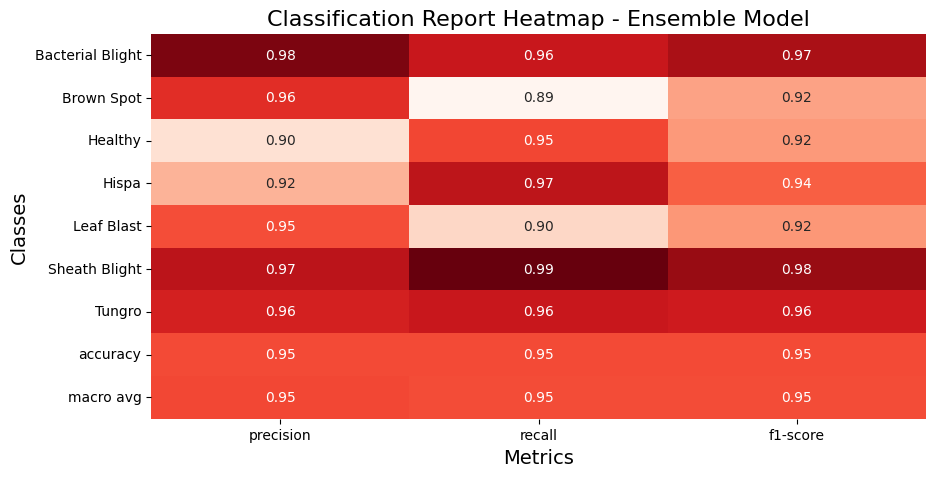

In [114]:
# Generate a classification report
report = classification_report(true_labels, pred_labels, target_names=class_names, output_dict=True)

# Convert the report to a DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Plot the heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap=plt.cm.Reds, fmt=".2f", cbar=False)
plt.title('Classification Report Heatmap - Ensemble Model', fontsize=16)
plt.xlabel('Metrics', fontsize=14)
plt.ylabel('Classes', fontsize=14)
plt.show()

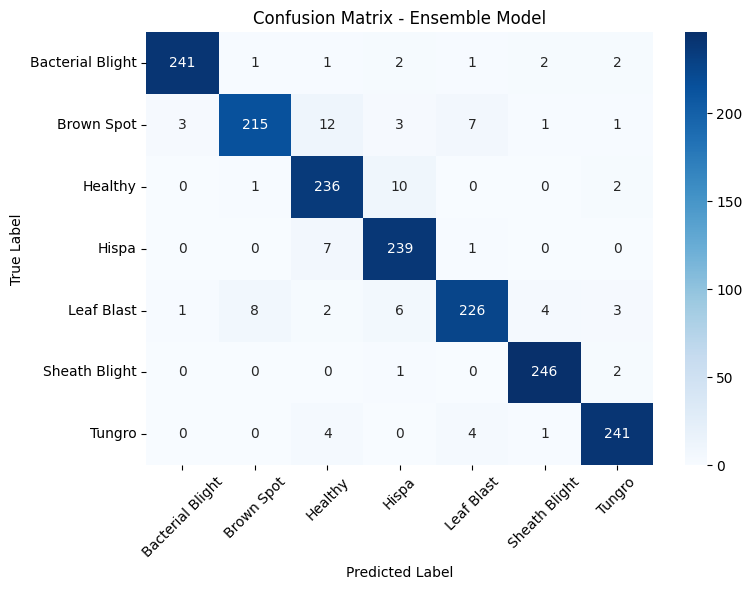

In [115]:
# Generate and plot the confusion matrix
conf_matrix = confusion_matrix(true_labels, pred_labels)

# Create figure with heatmap for confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix - Ensemble Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


Found 93 mispredicted images.


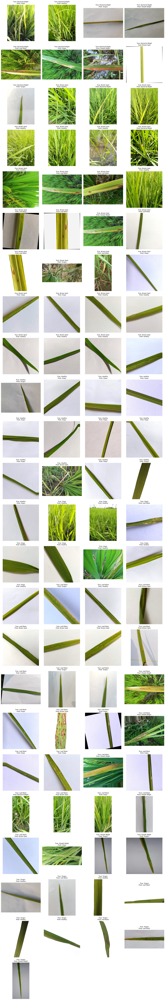

In [116]:
# Identify and display mispredicted images
mispredicted_indices = np.where(pred_labels != true_labels)[0]
if len(mispredicted_indices) == 0:
    print("\nNo mispredictions found!")
else:
    print(f"\nFound {len(mispredicted_indices)} mispredicted images.")

    # Calculate grid size for plotting
    num_mispredictions = len(mispredicted_indices)
    cols = 4  # Number of columns in the grid
    rows = (num_mispredictions + cols - 1) // cols  # Ceiling division to get rows

    # Create a figure for plotting
    plt.figure(figsize=(cols * 4, rows * 4))  # Adjust size based on grid

    # Base directory for test images
    test_dir = r'D:\CADT\CapstoneProjectI\ml__model\data\splited_data\test'

    # Plot each mispredicted image
    for i, idx in enumerate(mispredicted_indices):
        # Get the image path
        filename = test_ds.filenames[idx]
        img_path = os.path.join(test_dir, filename)

        # Load the image
        img = Image.open(img_path)

        # Get true and predicted labels as class names
        true_label = class_names[true_labels[idx]]
        predicted_label = class_names[pred_labels[idx]]

        # Plot the image
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"True: {true_label}\nPred: {predicted_label}", fontsize=10)
        plt.axis('off')

    # Adjust layout and display
    plt.tight_layout()
    plt.show()